# Market research of the catering establishments in Moscow

**Project Description:** Investors from the "Shut Up and Take My Money" fund decided to try their hand at a new field and open a coffee shop in Moscow. 

**Research Objective:** To identify valuable patterns, to present the obtained results and to provide recommendations for opening a coffee shop.

**Sources:** A set of data on catering establishments in Moscow based on Yandex Maps and Yandex Business data for the summer of 2022 (moscow_places.csv). *Columns:*

- name — name of the establishment;
- address — address of the establishment;
- category — category of the establishment, such as "café," "pizzeria," or "coffee shop";
- hours — working hours and weekdays;
- lat — latitude of the geographical point where the establishment is located;
- lng — longitude of the geographical point where the establishment is located;
- rating — rating of the establishment based on user reviews on Yandex Maps (highest rating is 5.0);
- price — price category at the establishment, such as "average," "below average," "above average," etc.;
- avg_bill — a string that stores the average cost of an order in the form of a range, for example:
    - "Average bill: 1000–1500 ₽";
    - "Price of a cappuccino: 130–220 ₽";
    - "Price of a pint of beer: 400–600 ₽";
    - etc.;
- middle_avg_bill — a number representing the average bill, which is only specified for values in the avg_bill column that start with the substring "Average bill":
    - If the string specifies a price range with two values, the column will contain the median of these two values.
    - If the string specifies a single number (price without a range), the column will contain that number.
    - If there is no value or it does not start with the substring "Average bill," the column will remain empty.
- middle_coffee_cup — a number representing the price of one cappuccino, which is only specified for values in the avg_bill column that start with the substring "Price of one cappuccino":
    - If the string specifies a price range with two values, the column will contain the median of these two values.
    - If the string specifies a single number (price without a range), the column will contain that number.
    - If there is no value or it does not start with the substring "Price of one cappuccino," the column will remain empty.
- chain — a number expressed as 0 or 1, indicating whether the establishment is part of a chain (errors may occur for small chains);
- district — administrative district where the establishment is located
- seats — number of seating places.

**Main steps:**

1. Perform primary data analysis
2. Preprocess the data
3. Perform detailed data analysis
4. Pefrorm detailed analysis down to the coffee shop category
5. Prepare overall conclusions of the research

Thus, this study will help to determine the most suitable district for opening an establishment, decide whether a 24-hour coffeeshop should be opened and what the average price of a cup of coffee should be. This research will help to confidently start a new line of business and to avoid the high competition in the market.

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
import folium

## Primary data analysis

In [5]:
df = pd.read_csv('C:/Users/as100/Documents/Portfolio/moscow_places.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [7]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

### Additional step for data readability: translating initial data to English

In [9]:
# category 

df['category'] = df['category'].replace({
    'кафе':'cafe',
    'ресторан':'restaurant',
    'кофейня':'coffeeshop',
    'пиццерия':'pizzeria',
    'бар,паб':'bar,pub',
    'быстрое питание':'fastfood',
    'булочная':'bakery',
    'столовая':'canteen'
})

In [10]:
# district

df['district_rus'] = df['district']

df['district'] = df['district'].replace({
    'Северный административный округ':'Northern administrative district',
    'Северо-Восточный административный округ':'North-Eastern administrative district',
    'Северо-Западный административный округ':'North-Western administrative district',
    'Западный административный округ':'Western administrative district',
    'Центральный административный округ':'Central administrative district',
    'Восточный административный округ':'Eastern administrative district',
    'Юго-Восточный административный округ':'South-Eastern administrative district',
    'Южный административный округ':'Southern administrative district',
    'Юго-Западный административный округ':'South-Western administrative district'
})

In [11]:
# hours

hours_replacements = {
    'ежедневно': 'daily',
    'пн':'mon',
    'вт':'tues',
    'ср':'wed',
    'чт':'thurs',
    'пт':'fri',
    'сб':'sat',
    'вс':'sun',
    'круглосуточно':'24/7',
    'перерыв':'break'
}

df['hours'] = df['hours'].replace(hours_replacements, regex=True)

In [12]:
# price group

df['price'] = df['price'].replace({
    'выше среднего':'above average',
    'средние':'average',
    'высокие':'expensive',
    'низкие':'below average'
})

In [13]:
# avg_bill

bill_replacements = {
    'Средний счёт': 'Average bill',
    'Цена чашки капучино':'Price of a cappuccino',
    'Цена бокала пива':'Price of a pint of beer'
}

df['avg_bill'] = df['avg_bill'].replace(bill_replacements, regex=True)

**Summary:**

- It is evident that we are dealing with 8046 rows of data and 14 columns. There are missing values present in 6 of these columns.
- Possible reasons for these missing values include: the information posted on the Yandex Business service may have been added by users or sourced from publicly available information. This implies that such gaps could have arisen from a lack of information in public sources or from users not filling out fields due to either reluctance or lack of knowledge.
- Preprocessing the missing values: Given that we are working with data that exhibits a wide range of values (for example, when analyzing the number of seats in the analytics section below), it is recommended not to process the missing values at all. Although this will reduce our sample size, we will achieve a more accurate result based on the data we do have. Furthermore, we are already constructing heatmaps based on average checks, which will reflect the same values regardless of how we might fill in the gaps.

## Data preprocessing

In [16]:
# street designation
df['street'] = df['address'].str.split(', ').str[1]

*We perform duplicates removal below by the facility name and its address. In this dataframe, we have no dates of info update date, so we cannot tell which subset is the most recent. Thus, if we can't give preference to a particular duplicate, it makes no difference which of the duplicates we eliminate. Obviously, 2 identical establishments cannot be at the same address*

In [18]:
df = df.drop_duplicates(subset=['name','address'])

In [19]:
# 24-hour facility
df['is_24_7'] = df['hours'].apply(lambda x: True if x == 'daily, 24/7' else False)

In [20]:
# exploring of unique working hours for implicit duplicates
unique_hours = df.loc[df['hours'].str.contains('daily', na=False), 'hours'].unique()
for i in unique_hours:
    print (i)

daily, 10:00–22:00
daily, 09:00–22:00
daily, 10:00–23:00
daily, 12:00–00:00
daily, 24/7
daily, 10:00–21:00
daily, 08:00–22:00
daily, 13:00–00:00
daily, 09:00–21:00
daily, 10:00–19:00
daily, 08:00–21:00
daily, 09:00–23:00
daily, 08:00–23:00
daily, 11:00–00:00
daily, 09:00–02:00
daily, 12:00–23:00
daily, 12:00–03:00
daily, 16:00–06:00
daily, 09:00–01:00
daily, 11:00–23:00
daily, 09:00–06:00
daily, 10:00–21:30
daily, 08:00–00:00
daily, 06:00–20:00
daily, 10:00–20:00
daily, 11:00–22:00
daily, 10:30–23:00
daily, 07:00–00:00
daily, 10:00–22:00, break 16:00–16:20
daily, 13:00–04:00
daily, 11:00–19:00
daily, 16:00–04:00
daily, 09:00–00:00
daily, 10:00–01:00
daily, 11:00–22:30
daily, 07:30–00:30
daily, 08:30–23:30
daily, 13:00–01:00
daily, 11:00–06:00
daily, 07:00–23:00
daily, 18:00–05:00
daily, 11:00–21:30
daily, 10:00–00:00
daily, 09:00–20:00
daily, 11:30–00:00
daily, 11:00–02:00
daily, 08:00–20:00
daily, 07:00–02:00
daily, 09:00–23:45
daily, 12:00–05:00
daily, 12:00–02:00
daily, 12:00–01:00


<b>Summary: </b> Above we:

- studied the basic information about the data used.
- analyzed the origin of the data and the need to preprocess missing values.
- removed explicit and implicit duplicates.
- created two new columns: one contains the street on which the establishment is located, and the second indicates whether the establishment operates on a adaily basis 27/7

## Detailed data analysis

### Facility Categories

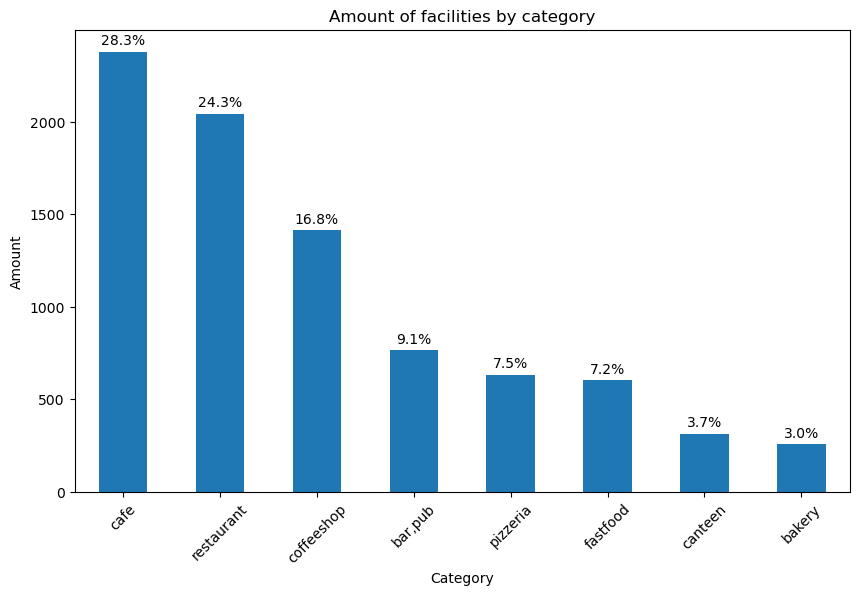

In [24]:
category_counts = df['category'].value_counts()
ax = category_counts.plot(kind='bar', figsize=(10, 6), rot=45)
plt.title('Amount of facilities by category')
plt.xlabel('Category')
plt.ylabel('Amount')

total = len(df['category']) 
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total) 
    x = p.get_x() + p.get_width() / 2
    y = p.get_height() + 0.5
    ax.annotate(percentage, (x, y), textcoords="offset points", xytext=(0, 5), ha='center') 

plt.show()

**Summary:** The most popular type of establishment is the café. The top three categories by popularity are cafés, restaurants, and coffee shops. Bars, pizzerias, and fast food establishments fall into the "middle" group. The least popular category is the bakery. Canteen is slightly more popular than the bakery

### Number of seats by category

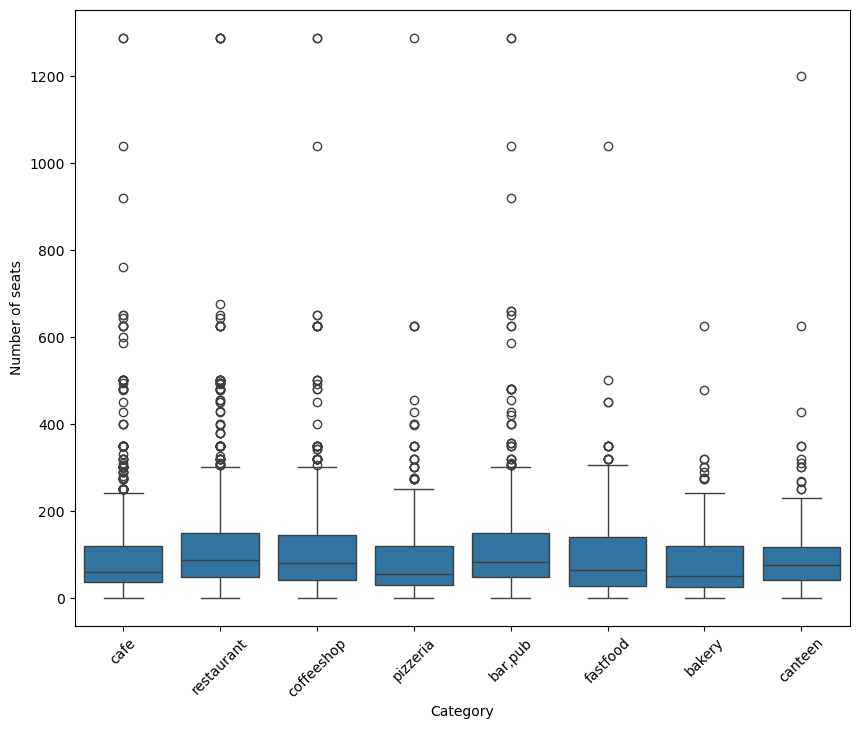

In [27]:
plt.figure(figsize=(10, 8))
sns.boxplot(data=df, x='category', y='seats')
plt.xlabel('Category')
plt.ylabel('Number of seats')
plt.xticks(rotation=45)
plt.show()

**Summary:** The greatest variability in the number of seats is observed in restaurants, coffee shops, bars and fast food establishments. Cafés can be singled out separately, as the number of outliers in this category is the most pronounced. Fast food can be considered the most "stable" in terms of the number of seats, with only four outliers shown in the boxplot. In general, looking at the upper limits of the whiskers, we can say that across all categories, the number of seats ranges from 230 to 300.

### Proportion of chain establishments to non-chain establishments

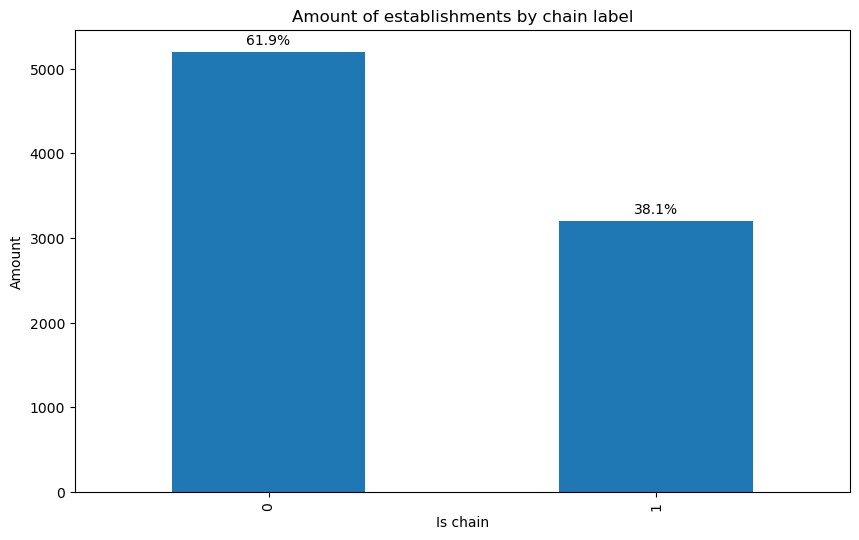

In [30]:
category_counts = df['chain'].value_counts()
ax = category_counts.plot(kind='bar', figsize=(10, 6))
plt.title('Amount of establishments by chain label')
plt.xlabel('Is chain')
plt.ylabel('Amount')

total = len(df['chain']) 
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total) 
    x = p.get_x() + p.get_width() / 2
    y = p.get_height() + 0.5
    ax.annotate(percentage, (x, y), textcoords="offset points", xytext=(0, 5), ha='center') 

plt.show()

**Summary:** Chain establishments account for 38% of the total sample. Accordingly, 62% are non-chain.

### Proportion of chain establishments to non-chain establishments by category 

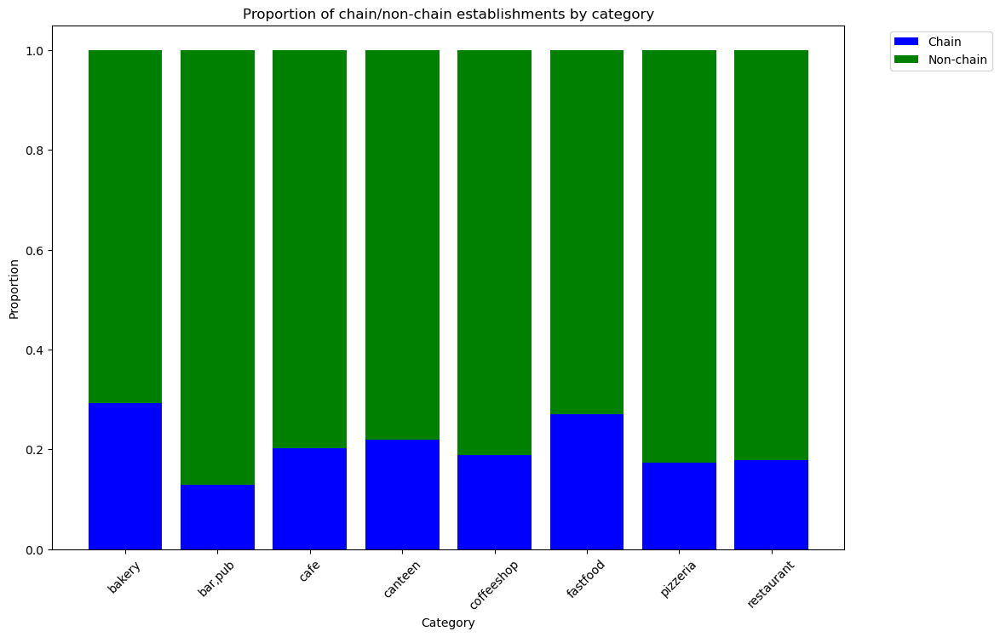

In [33]:
df_just_chains = df[['name', 'category', 'chain']]
df_just_chains = df_just_chains.drop_duplicates()

total_counts = df_just_chains.groupby('category').size()
chain_counts = df_just_chains[df_just_chains['chain'] == 1].groupby('category').size()
chain_ratio = chain_counts / total_counts

fig, ax = plt.subplots(figsize=(12,8))
bars1 = ax.bar(chain_ratio.index, chain_ratio, color='b', label='Chain')
bars2 = ax.bar(chain_ratio.index, 1-chain_ratio, bottom=chain_ratio, color='g', label='Non-chain')
ax.set_title('Proportion of chain/non-chain establishments by category')
ax.set_xlabel('Category')
ax.set_ylabel('Proportion')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

**Summary:** To determine the share of chain establishments, we created a separate dataframe containing only the name, category, and a "chain" indicator, and then removed duplicates. This allowed us to obtain a clean sample that showed what proportion chain establishments occupy within their category. The graph shows a roughly equal distribution, with only bakeries and fast food standing out slightly as having a higher presence.

### TOP-15 most popular facilities by district and category

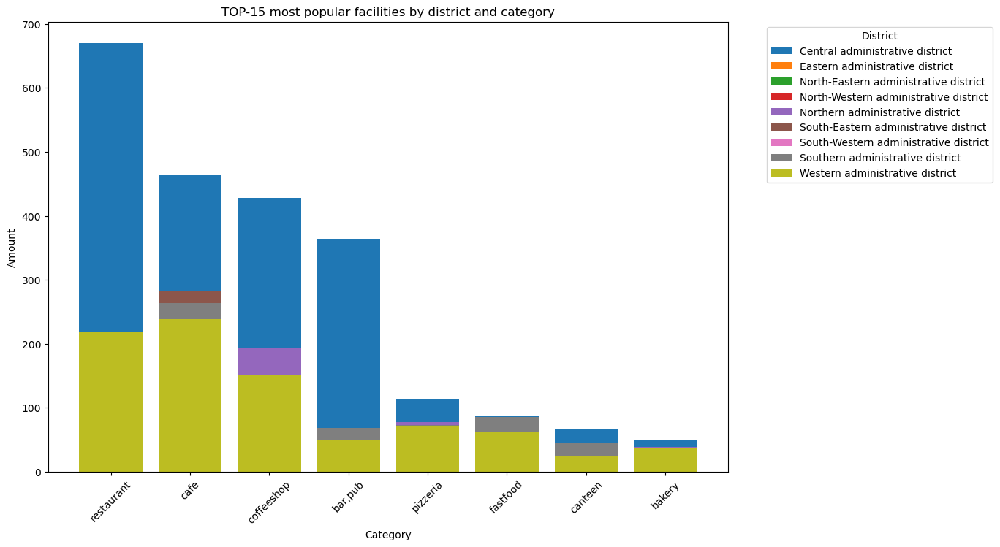

In [36]:
grouped = df.groupby(['category', 'district']).size().reset_index(name='count')
top_15_by_district = grouped.sort_values('count', ascending=False).groupby('district').head(15).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(12, 8))
for district, data in top_15_by_district.groupby('district'):
    ax.bar(data['category'], data['count'], label=district)

ax.set_xlabel('Category')
ax.set_ylabel('Amount')
ax.set_title('TOP-15 most popular facilities by district and category')
ax.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(rotation=45)  
plt.show()

### TOP-15 most popular facilities by district, category and name

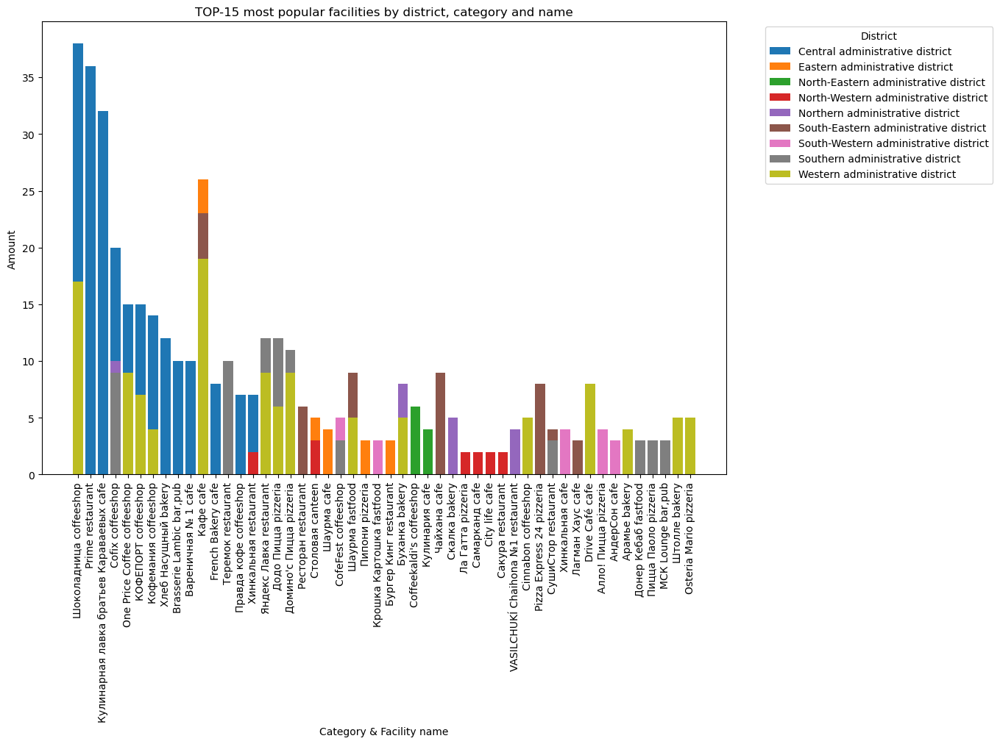

In [38]:
df['concat_name_cat'] = df['name'] + ' ' + df['category']
grouped = df.groupby(['concat_name_cat', 'district']).size().reset_index(name='count')
top_15_by_district = grouped.sort_values('count', ascending=False).groupby('district').head(15).reset_index(drop=True) 

fig, ax = plt.subplots(figsize=(12, 8))
for district, data in top_15_by_district.groupby('district'):
    ax.bar(data['concat_name_cat'], data['count'], label=district)

ax.set_xlabel('Category & Facility name')
ax.set_ylabel('Amount')
ax.set_title('TOP-15 most popular facilities by district, category and name')
ax.legend(title='District', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.xticks(rotation=90)  
plt.show()

**Summary:** The most popular chains are united by their location. It is evident that popular chains are present in the city center. The second place in terms of the number of popular establishments is occupied by the South-Eastern Administrative district. Establishments with a count of 20 or more belong to the categories of café, coffee shop and restaurant. Other than that, there is a roughly equal distribution across the districts.

### Amount of facilities by district and category

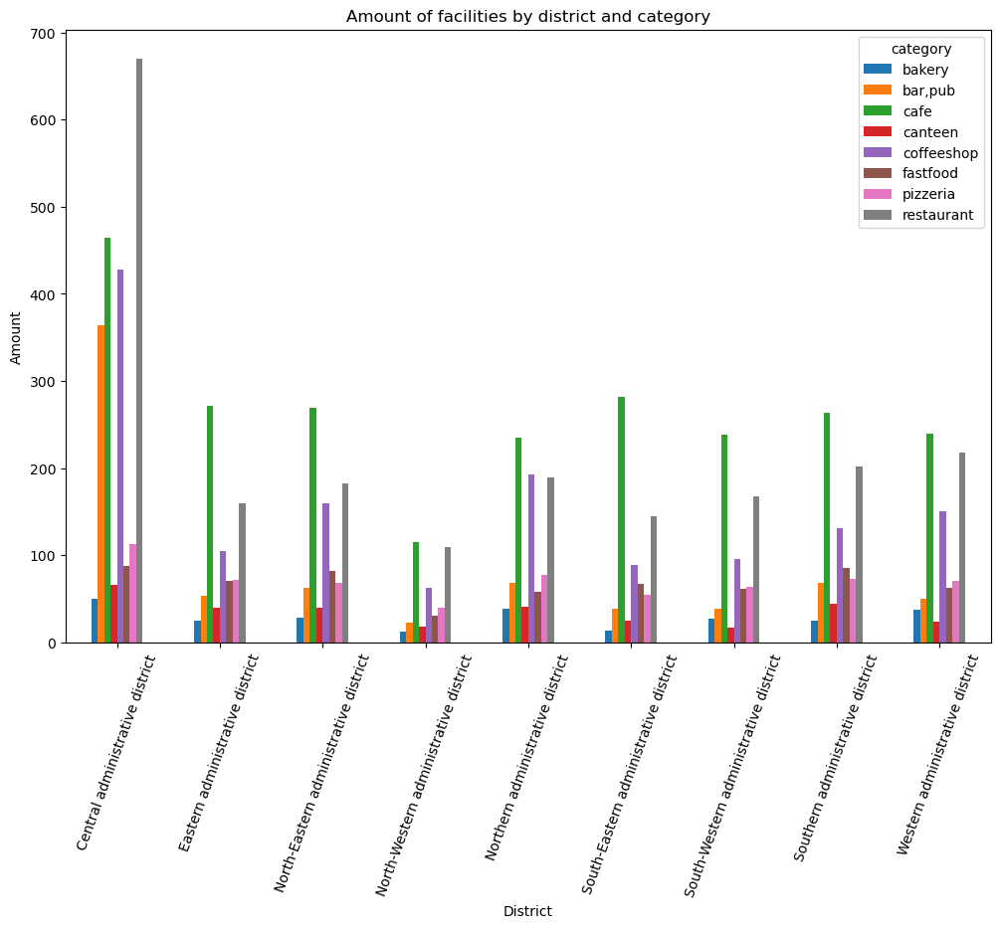

In [41]:
grouped_counts = df.groupby(['district', 'category']).size().unstack()

ax = grouped_counts.plot(kind='bar', figsize=(12, 8))
plt.title('Amount of facilities by district and category')
plt.xlabel('District')
plt.ylabel('Amount')
plt.xticks(rotation=70) 

plt.show()

**Summary:** The largest number of establishments is found in the Central Administrative district, while the fewest are in the North-Western Administrative district. The diagram shows a roughly equal distribution of categories across districts.

### Average facility rating by its category

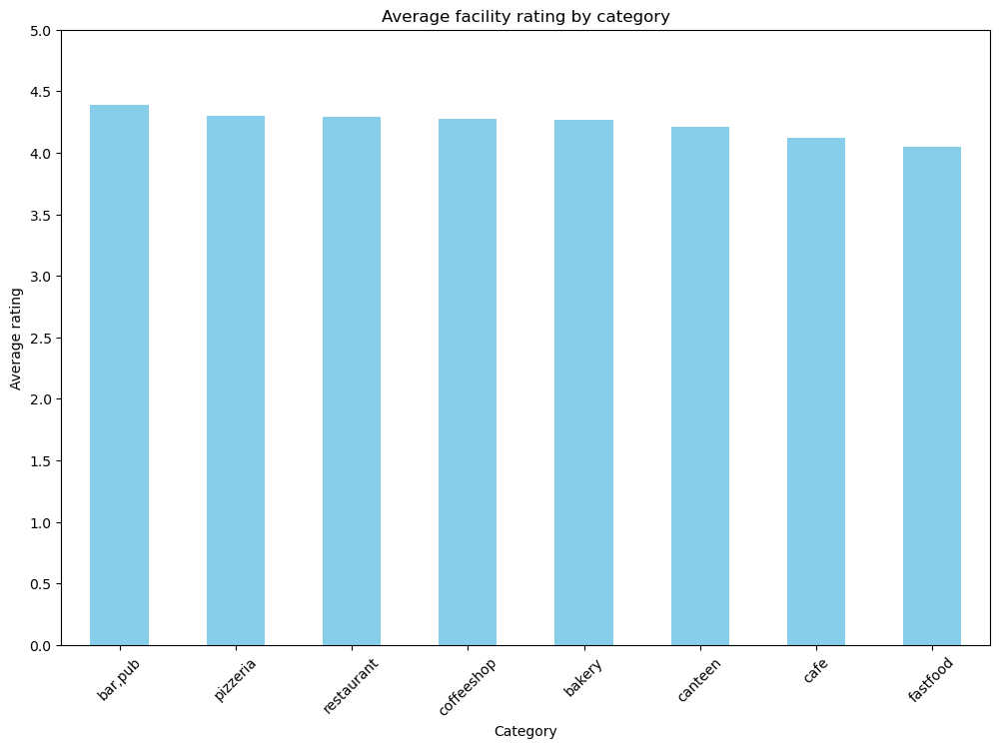

In [44]:
mean_ratings = df.groupby('category')['rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
mean_ratings.plot(kind='bar', color='skyblue')
plt.title('Average facility rating by category')
plt.xlabel('Category')
plt.ylabel('Average rating')
plt.yticks([i/2 for i in range(11)]) 
plt.xticks(rotation=45)
plt.show()

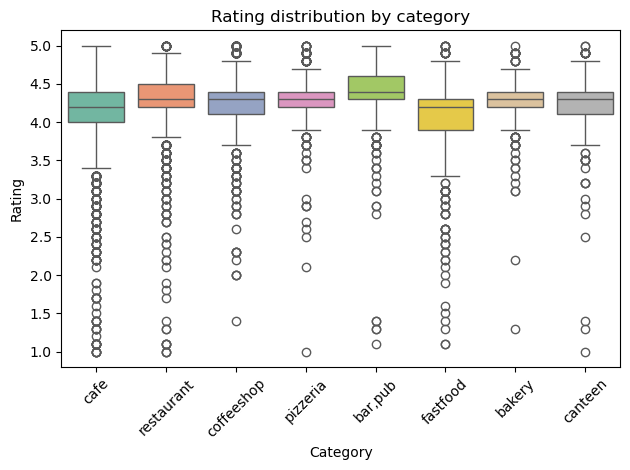

In [45]:
sns.boxplot(x='category', y='rating', data=df, palette='Set2', hue='category', legend=False)
plt.title('Rating distribution by category')
plt.xlabel('Category')
plt.ylabel('Rating')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

**Summary:** We observe an even distribution of ratings among all categories of establishments. All ratings range from 4.3 to 4.4.

### Average facility rating by its category and district

In [48]:
admin_level_geomap = 'C:/Users/as100/Documents/Portfolio/admin_level_geomap.geojson'
avg_rating_by_district = df.groupby('district_rus')['rating'].mean().reset_index()
district_geojson = json.load(open(admin_level_geomap, encoding='utf-8'))
m = folium.Map(location=[55.7558, 37.6173], zoom_start=10)

folium.Choropleth(
    geo_data=district_geojson,
    name='choropleth',
    data=avg_rating_by_district,
    columns=['district_rus', 'rating'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Rating'
).add_to(m)

m

**Summary:** The highest ratings are found in establishments located in Central district, while the lowest are in South-Eastern district. The remaining ratings are distributed fairly evenly, but North-Western district stands out in second place after center.

### All location points 

In [51]:
m = folium.Map(location=[55.7558, 37.6173], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

# adding facility names
for idx, row in df.iterrows():
    folium.Marker([row['lat'], row['lng']], popup=row['name']).add_to(marker_cluster)

m

### TOP-15 streets by number of establishments

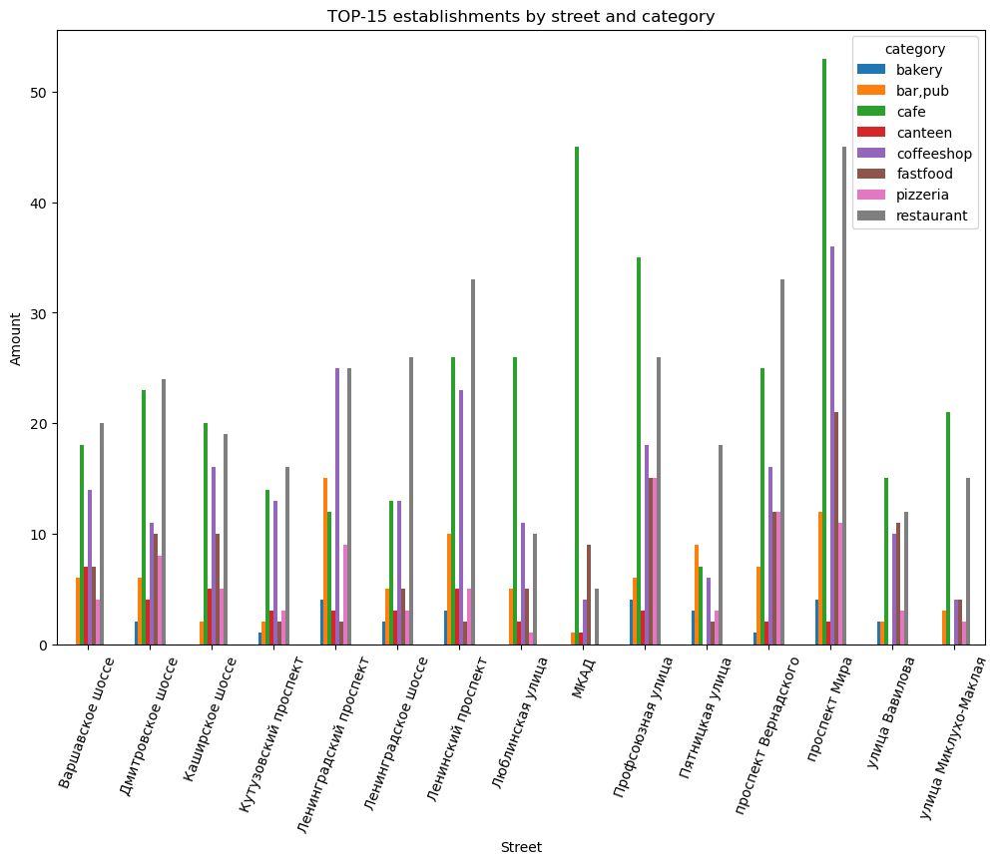

In [53]:
top_streets = df['street'].value_counts().head(15).index.tolist()
top_15 = df[df['street'].isin(top_streets)]

grouped_counts = top_15.groupby(['street','category']).size().unstack()

ax = grouped_counts.plot(kind='bar', figsize=(12, 8))
plt.title('TOP-15 establishments by street and category')
plt.xlabel('Street')
plt.ylabel('Amount')
plt.xticks(rotation=70)  

plt.show()

**Summary:** The graph shows streets where it is not advisable to open establishments, as they are heavily overloaded with them. At the very least, it is not recommended to open restaurants, coffee shops, or cafes there. On the other hand, these streets are the most most passable ones, so one might consider less popular categories located on them (for example, pizzerias or bakeries).

### Single-establishment by district and category

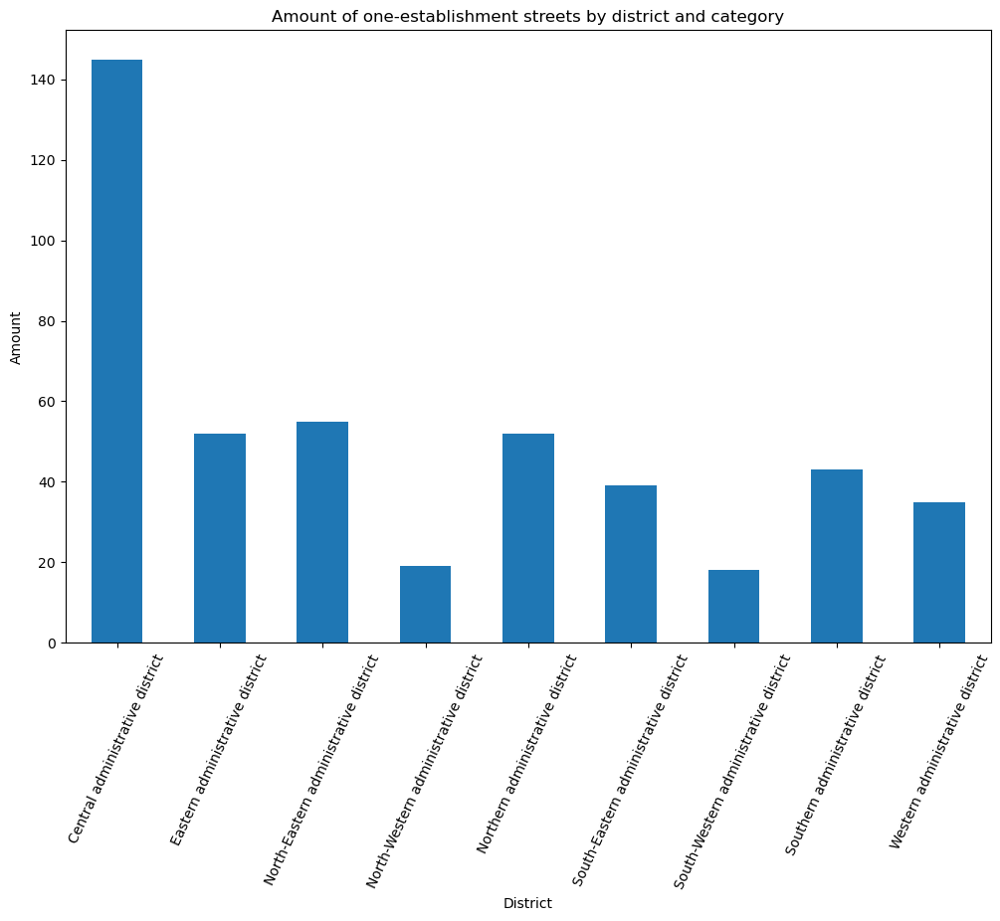

In [56]:
street_counts = df['street'].value_counts()
streets_with_one_object = street_counts[street_counts == 1].index.tolist()
one_obj = df[df['street'].isin(streets_with_one_object)]

grouped_counts = one_obj.groupby(['district']).size()

ax = grouped_counts.plot(kind='bar', figsize=(12, 8))
plt.title('Amount of one-establishment streets by district and category')
plt.xlabel('District')
plt.ylabel('Amount')
plt.xticks(rotation=65)  

plt.show()

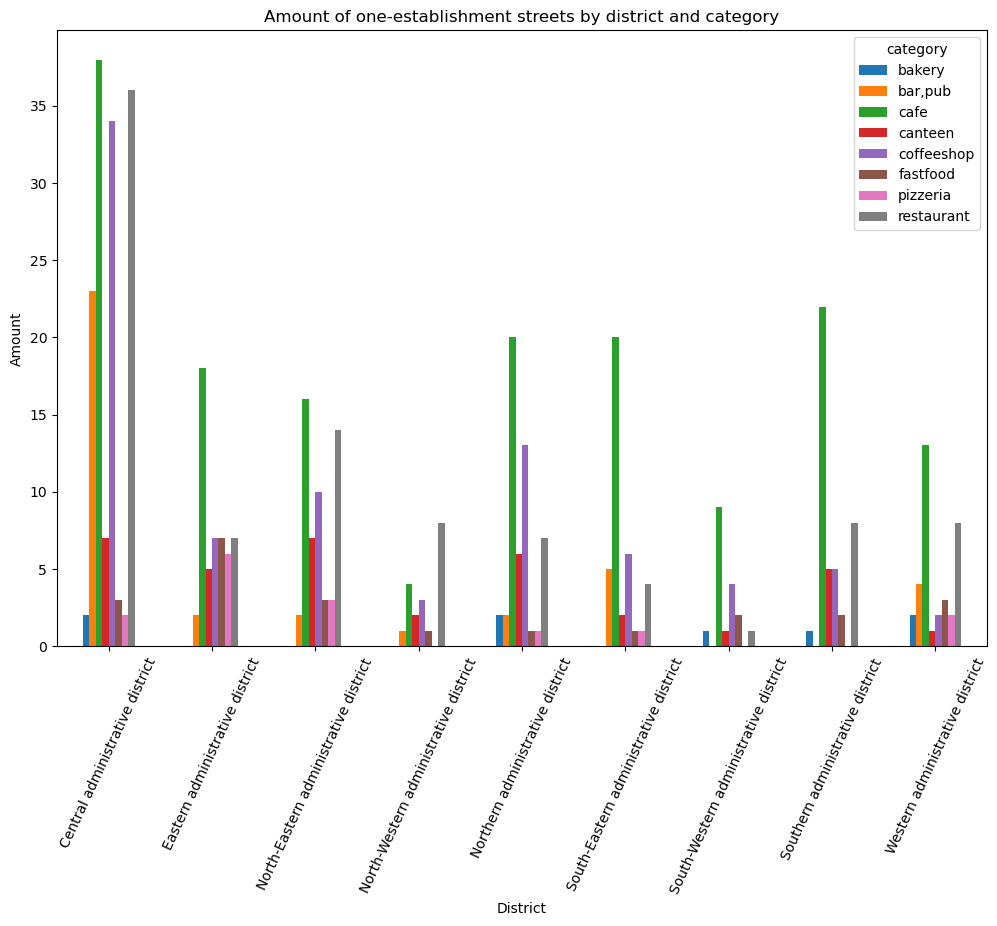

In [57]:
grouped_counts = one_obj.groupby(['district', 'category']).size().unstack()

ax = grouped_counts.plot(kind='bar', figsize=(12, 8))
plt.title('Amount of one-establishment streets by district and category')
plt.xlabel('District')
plt.ylabel('Amount')
plt.xticks(rotation=65)  

plt.show()

**Summary:** It can be said that bars, cafes, coffee shops and restaurants dominate among such establishments. The area with the highest concentration is the Central Administrative district, which has just over 140 streets with a single establishment. Between 40 and 60 streets with a single establishment are found in Eastern, Northern, North-Eastern, South-Eastern and Southern districts. The least number of such streets is in the North-Western and South-Western districts - their number does not exceed 20.

### Choropleth of middle average bill per district

In [60]:
median_price_by_district = df.groupby('district_rus')['middle_avg_bill'].median().reset_index()
median_price_by_district_eng = df.groupby('district')['middle_avg_bill'].median().reset_index()

pivot_table = median_price_by_district.pivot_table(index='district_rus', values='middle_avg_bill').sort_values(by='middle_avg_bill', ascending=False)
pivot_eng = median_price_by_district_eng.pivot_table(index='district', values='middle_avg_bill').sort_values(by='middle_avg_bill', ascending=False)
print(pivot_eng)

district_geojson = json.load(open(admin_level_geomap, encoding='utf-8'))
m = folium.Map(location=[55.7558, 37.6173], zoom_start=10)

folium.Choropleth(
    geo_data=district_geojson,
    name='choropleth',
    data=median_price_by_district,
    columns=['district_rus', 'middle_avg_bill'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Median Middle Average Bill'
).add_to(m)

m

                                       middle_avg_bill
district                                              
Central administrative district                 1000.0
Western administrative district                 1000.0
North-Western administrative district            700.0
Northern administrative district                 650.0
South-Western administrative district            600.0
Eastern administrative district                  575.0
North-Eastern administrative district            500.0
Southern administrative district                 500.0
South-Eastern administrative district            450.0


**Summary:** Visualization demonstrates that the highest prices are set in Western and Central districts. It is expected that prices will be highest in the center. However, prices in Western district remain at a level comparable to the center. Overall, this prices can be explained by the presence of Rublevka (one on the most prestigious streets in Moscow), the airport and Moscow City in this district. Southern, South-Eastern and Eastern districts are cheapest ones. 

### Final summary (all categories):

We conducted an analysis of the main metrics of the examined dataset. Based on the analysis conducted, we can conclude that:

1. The most popular type of establishment is cafe. The top three categories by popularity are cafes, restaurants, and coffee shops. Bars, pizzerias, and fast food fall into the "middle" group. The least popular category is bakeries, which are only slightly more popular than canteens.
2. The biggest range of seats number is observed in restaurants, coffee shops, bars and fast food. However, fast food can be considered the most "stable" among other categories since it has only 4 outliers.
3. Chain establishments account for 38% of the total sample, while 62% are non-chain.
4. The most popular chains are mainly present in the city center. The second place in terms of the number of popular establishments goes to South-Eastern district.
5. The largest number of establishments is found in North-Western district, while there are the fewest in North-Eastern one. Categories are distributed evenly across districts, except for bars in North-West, which have significant concentration compared to other districts.
6. Establishments in central part have the highest ratings, while those in South-East have the lowest. The remaining ratings are distributed evenly except for North-West, which also shows high ratings.
7. We identified a list of streets where the highest number of establishments is concentrated. These are mainly avenues and highways. The predominant categories on these streets are: restaurants, cafes and coffee shops. There are the fewest bakeries and no pizzerias on such streets.
8. Single-establishment streets are more commonly found among bars, cafes, coffee shops and restaurants. The area with the highest concentration of such solitary establishments is Central district.
9. The highest prices are in Western and Central districts, while the lowest ones present in South, South-East And East. The rest of districts keep prices on the average level.

## Exploring coffee shop market 

### Number of coffeeshops by districts

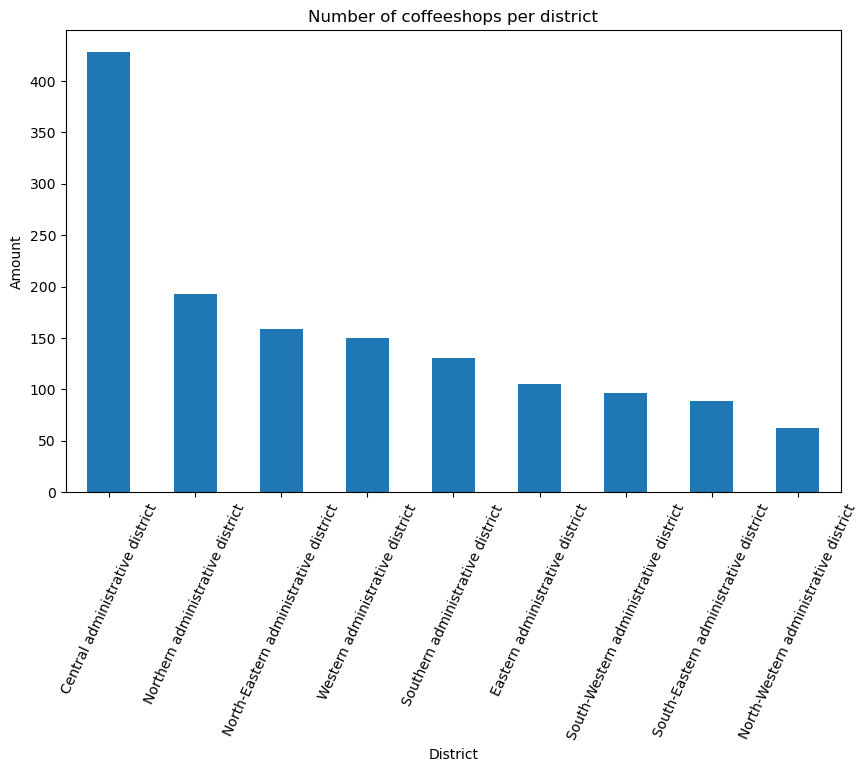

In [65]:
coffee_shops = df[df['category'] == 'coffeeshop']
coffee_shops_by_district = coffee_shops['district'].value_counts()
plt.figure(figsize=(10, 6))
coffee_shops_by_district.plot(kind='bar')
plt.title('Number of coffeeshops per district')
plt.xlabel('District')
plt.ylabel('Amount')
plt.xticks(rotation=65)  
plt.show()

### 24/7 coffeeshops distribution

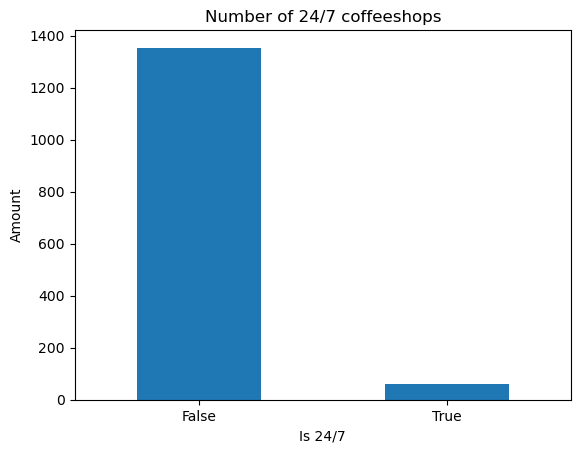

In [67]:
coffee_shops_247 = coffee_shops['is_24_7'].value_counts()
ax = coffee_shops_247.plot(kind='bar')

plt.title('Number of 24/7 coffeeshops')
plt.xlabel('Is 24/7')
plt.ylabel('Amount')
plt.xticks(rotation=0)  
plt.show()

### Average rating per district (only coffee shops)

In [69]:
coffee_shops_rate = coffee_shops.groupby('district_rus')['rating'].mean().reset_index()
district_geojson = json.load(open(admin_level_geomap, encoding='utf-8'))
m = folium.Map(location=[55.7558, 37.6173], zoom_start=10)

folium.Choropleth(
    geo_data=district_geojson,
    name='choropleth',
    data=coffee_shops_rate,
    columns=['district_rus', 'rating'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average Rating'
).add_to(m)

m

### Target price of cup of coffee by district

In [71]:
median_cup_by_district = coffee_shops.groupby('district_rus')['middle_coffee_cup'].median().reset_index()
district_geojson = json.load(open(admin_level_geomap, encoding='utf-8'))
m = folium.Map(location=[55.7558, 37.6173], zoom_start=10)

folium.Choropleth(
    geo_data=district_geojson,
    name='choropleth',
    data=median_cup_by_district,
    columns=['district_rus', 'middle_coffee_cup'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Median Middle Coffee Bill'
).add_to(m)

m

### Final summary

1. The sample includes a total of 1413 coffee shops.
2. The Central Administrative district has the highest concentration of coffee shops, while the distribution of coffee shops across other districts is approximately equal. The North-Western Administrative district has the fewest coffee shops. 
3. Approximately 50 coffee shops (~3%) operate 24/7.
4. Coffee shops in Center and North-West have high ratings, while those in West and North receive the lowest customer satisfaction.
5. The average price for a cup of coffee varies depending on the district. In Center, West and South-West a cup of coffee usually costs 200 rubles; in North-Eastern district it costs 135 rubles, while in other districts it is around 160 rubles.

### Recommendations

1. It is advisable to target districts with high demand. For example, opening a coffee shop in Center may not be effective due to high competition rate, which could hinder the establishment's growth. Attention could be directed towards districts with lower average ratings for establishments, such as South and West.
2. Considering the option of opening a 24/7 coffee shop with an average cup price of 140 rubles could be beneficial.

Finally, this approach would provide three advantages upon opening: 
- better customer orientation
- permanent availability 
- slightly lower price than average one (but not too cheap)

In this way, the company can optimally expand its customer base, leading to rapid growth and leading positions among other facilities.